# DATA VISUALIZATION AND EXPLORATORY DATA ANALYSIS (EDA)

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import rcParams
import plotly.express as px
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

# Loading dataset

In [2]:
df=pd.read_csv('data.csv')
df.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [3]:
df_copy=df.copy()

#keeping a copy of df in df_copy

In [4]:
df.shape

(12000, 16)

# Missing value & Null Value handling

In [5]:
print(df.isnull().sum())

Make                    0
Model                   0
Year                    0
Engine Fuel Type        3
Engine HP              69
Engine Cylinders       30
Transmission Type       0
Driven_Wheels           0
Number of Doors         6
Market Category      3742
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
Popularity              0
MSRP                    0
dtype: int64


In [6]:
df[df.isnull().any(axis=1)]

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
87,Nissan,200SX,1996,regular unleaded,115.0,4.0,MANUAL,front wheel drive,2.0,NaN,Compact,Coupe,36,26,2009,2000
88,Nissan,200SX,1996,regular unleaded,115.0,4.0,MANUAL,front wheel drive,2.0,NaN,Compact,Coupe,36,26,2009,2000
91,Nissan,200SX,1997,regular unleaded,115.0,4.0,MANUAL,front wheel drive,2.0,NaN,Compact,Coupe,35,25,2009,2000
92,Nissan,200SX,1997,regular unleaded,115.0,4.0,MANUAL,front wheel drive,2.0,NaN,Compact,Coupe,35,25,2009,2000
93,Nissan,200SX,1998,regular unleaded,115.0,4.0,MANUAL,front wheel drive,2.0,NaN,Compact,Coupe,35,25,2009,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11794,Subaru,XT,1991,regular unleaded,145.0,6.0,MANUAL,all wheel drive,2.0,NaN,Compact,Coupe,23,16,640,2000
11809,Toyota,Yaris iA,2017,regular unleaded,106.0,4.0,MANUAL,front wheel drive,4.0,NaN,Compact,Sedan,39,30,2031,15950
11810,Toyota,Yaris iA,2017,regular unleaded,106.0,4.0,AUTOMATIC,front wheel drive,4.0,NaN,Compact,Sedan,40,32,2031,17050
11867,GMC,Yukon,2015,premium unleaded (recommended),420.0,8.0,AUTOMATIC,rear wheel drive,4.0,NaN,Large,4dr SUV,21,15,549,64520


In [7]:
df=df.dropna(subset='Engine Fuel Type')

In [8]:
df.shape

(11997, 16)

In [9]:
df['Market Category']=df['Market Category'].fillna('Others')

In [10]:
#Imputing with mean
df['Engine HP']=df['Engine HP'].fillna(df['Engine HP'].mean())

In [11]:
#Imputing with mean
df['Engine Cylinders']=df['Engine Cylinders'].fillna(df['Engine Cylinders'].mean())

In [12]:
df.isnull().sum()

Make                 0
Model                0
Year                 0
Engine Fuel Type     0
Engine HP            0
Engine Cylinders     0
Transmission Type    0
Driven_Wheels        0
Number of Doors      6
Market Category      0
Vehicle Size         0
Vehicle Style        0
highway MPG          0
city mpg             0
Popularity           0
MSRP                 0
dtype: int64

In [13]:
df.shape

(11997, 16)

In [14]:
nulls=df.isnull().any(axis=1)
df_nulls=df.loc[nulls]
df_nulls

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
4666,Ferrari,FF,2013,premium unleaded (required),651.000000,12.0,AUTOMATED_MANUAL,all wheel drive,NaN,"Exotic,High-Performance",Large,Coupe,16,11,2774,295000
6930,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,105,102,1391,79500
6931,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,101,98,1391,66000
6932,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,High-Performance",Large,Sedan,105,92,1391,134500
6933,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,rear wheel drive,NaN,"Exotic,Performance",Large,Sedan,100,97,1391,74500
6934,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,107,101,1391,71000


In [15]:
df['Number of Doors'].min(),df['Number of Doors'].max()

(2.0, 4.0)

In [16]:
Ferrari_door=df[df['Make']=='Ferrari']
Ferrari_door.head(4)

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
294,Ferrari,360,2002,premium unleaded (required),400.0,8.0,MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Convertible,15,10,2774,160829
295,Ferrari,360,2002,premium unleaded (required),400.0,8.0,MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Coupe,15,10,2774,140615
296,Ferrari,360,2002,premium unleaded (required),400.0,8.0,AUTOMATED_MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Coupe,15,10,2774,150694
297,Ferrari,360,2002,premium unleaded (required),400.0,8.0,AUTOMATED_MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Convertible,15,10,2774,170829


In [17]:
Tesla=df[df['Make']=='Tesla']
Tesla.head(4)

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
6921,Tesla,Model S,2014,electric,249.235999,0.0,DIRECT_DRIVE,rear wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,90,88,1391,79900
6922,Tesla,Model S,2014,electric,249.235999,0.0,DIRECT_DRIVE,rear wheel drive,4.0,"Exotic,Performance",Large,Sedan,97,94,1391,69900
6923,Tesla,Model S,2014,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,94,86,1391,104500
6924,Tesla,Model S,2014,electric,249.235999,0.0,DIRECT_DRIVE,rear wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,90,88,1391,93400


In [18]:
df_nulls.loc[df['Make'] == 'Ferrari', 'Number of Doors'] = df_nulls.loc[df['Make'] == 'Ferrari', 'Number of Doors'].fillna(2)
df_nulls.loc[df['Make'] == 'Tesla', 'Number of Doors'] = df_nulls.loc[df['Make'] == 'Tesla', 'Number of Doors'].fillna(4)
df_nulls

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
4666,Ferrari,FF,2013,premium unleaded (required),651.000000,12.0,AUTOMATED_MANUAL,all wheel drive,2.0,"Exotic,High-Performance",Large,Coupe,16,11,2774,295000
6930,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,Performance",Large,Sedan,105,102,1391,79500
6931,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,Performance",Large,Sedan,101,98,1391,66000
6932,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,105,92,1391,134500
6933,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,rear wheel drive,4.0,"Exotic,Performance",Large,Sedan,100,97,1391,74500
6934,Tesla,Model S,2016,electric,249.235999,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,Performance",Large,Sedan,107,101,1391,71000


In [19]:
df.loc[df['Make'] == 'Ferrari', 'Number of Doors'] = df.loc[df['Make'] == 'Ferrari', 'Number of Doors'].fillna(2)

In [20]:
df.loc[df['Make'] == 'Tesla', 'Number of Doors'] = df.loc[df['Make'] == 'Tesla', 'Number of Doors'].fillna(4)

In [21]:
df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11995,Chrysler,200,2017,flex-fuel (unleaded/E85),184.0,4.0,AUTOMATIC,front wheel drive,4.0,Flex Fuel,Midsize,Sedan,36,23,1013,22490
11996,Chrysler,200,2017,flex-fuel (unleaded/E85),184.0,4.0,AUTOMATIC,front wheel drive,4.0,Flex Fuel,Midsize,Sedan,36,23,1013,25690
11997,Chrysler,200,2017,flex-fuel (unleaded/E85),295.0,6.0,AUTOMATIC,all wheel drive,4.0,"Flex Fuel,Performance",Midsize,Sedan,28,18,1013,30900
11998,Chrysler,200,2017,flex-fuel (unleaded/E85),184.0,4.0,AUTOMATIC,front wheel drive,4.0,Flex Fuel,Midsize,Sedan,36,23,1013,27795


In [22]:
df.isnull().sum()

#All missing values are handled

Make                 0
Model                0
Year                 0
Engine Fuel Type     0
Engine HP            0
Engine Cylinders     0
Transmission Type    0
Driven_Wheels        0
Number of Doors      0
Market Category      0
Vehicle Size         0
Vehicle Style        0
highway MPG          0
city mpg             0
Popularity           0
MSRP                 0
dtype: int64

# Data duplication handling

In [23]:
#Checking for duplicates
df.duplicated().sum()

801

In [24]:
df_duplicates=df[df.duplicated()]
df_duplicates

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
14,BMW,1 Series,2013,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,19,3916,31500
18,Audi,100,1992,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
20,Audi,100,1992,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
24,Audi,100,1993,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
25,Audi,100,1993,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11995,Chrysler,200,2017,flex-fuel (unleaded/E85),184.0,4.0,AUTOMATIC,front wheel drive,4.0,Flex Fuel,Midsize,Sedan,36,23,1013,22490
11996,Chrysler,200,2017,flex-fuel (unleaded/E85),184.0,4.0,AUTOMATIC,front wheel drive,4.0,Flex Fuel,Midsize,Sedan,36,23,1013,25690
11997,Chrysler,200,2017,flex-fuel (unleaded/E85),295.0,6.0,AUTOMATIC,all wheel drive,4.0,"Flex Fuel,Performance",Midsize,Sedan,28,18,1013,30900
11998,Chrysler,200,2017,flex-fuel (unleaded/E85),184.0,4.0,AUTOMATIC,front wheel drive,4.0,Flex Fuel,Midsize,Sedan,36,23,1013,27795


In [25]:
df=df.drop_duplicates()

In [26]:
df.duplicated().sum()

0

In [27]:
df.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11196.000000,11196.000000,11196.000000,11196.000000,11196.000000,11196.000000,11196.000000,1.119600e+04
mean,2010.716327,253.389629,5.665754,3.454091,26.611022,19.732583,1558.772061,4.193217e+04
std,7.228344,109.814434,1.794846,0.872968,8.978805,9.178676,1445.754942,6.154211e+04
min,1990.000000,55.000000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,172.000000,4.000000,2.000000,22.000000,16.000000,549.000000,2.160000e+04
50%,2015.000000,240.000000,6.000000,4.000000,25.000000,18.000000,1385.000000,3.069500e+04
75%,2016.000000,303.000000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.303625e+04
max,2017.000000,1001.000000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


In [28]:
df.shape

(11196, 16)

# Outlier detection

In [29]:
#Boxplot depicting the outliers in each column feature
for col in df.select_dtypes(exclude='object').columns:
    fig=px.box(df[col], orientation='h')
    fig.show()

##### Outliers is seen maximum in city MPG followed by highway MPG. Engine HP too has a significant number of outliers

# Outlier Removal

In [30]:
def Remove_Outlier(data,master_data):
    
    for col in data.columns:   
        quantiles = data[col].quantile([0.25, 0.5, 0.75])
        IQR=quantiles[0.75]-quantiles[0.25]
        lower_limit=quantiles[0.25]-(1.5*IQR)
        upper_limit=quantiles[0.75]+(1.5*IQR)
       
        
        #remove outliers
        lower_index=df[df[col]<=lower_limit].index
        upper_index=df[df[col]>=upper_limit].index
        
        master_data.drop(lower_index,inplace=True)
        master_data.drop(upper_index,inplace=True)

        plt.axvline(x=lower_limit, color='r', linestyle='--')
        plt.axvline(x=upper_limit, color='g', linestyle='--')
        #plt.axhline(y=np.std(column_name),color='yellow')
        #plt.axvline(x=quantiles[0.75], color='b', linestyle='--')
        plt.errorbar(x=np.mean(df[col]),y=50,xerr=np.std(df[col]),color='r',linestyle='--')
        plt.hist(data[col])
        plt.title(col+ ' Distribution')
        plt.xlabel("Value")
        plt.ylabel("Frequency")
        plt.legend(['lower_limit', 'upper_limit','Mean'])
        print("Q1 = ",quantiles[0.25], " and Q3 = ",quantiles[0.75] )
        plt.show()
        plt.savefig('one.jpg')
        plt.close()
    return master_data

   

# Measure of central tendency and dispersion - Graphical Representation

Q1 =  2007.0  and Q3 =  2016.0


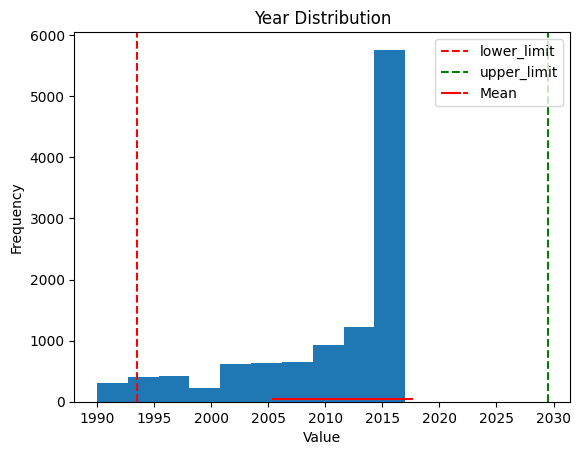

Q1 =  172.0  and Q3 =  303.0


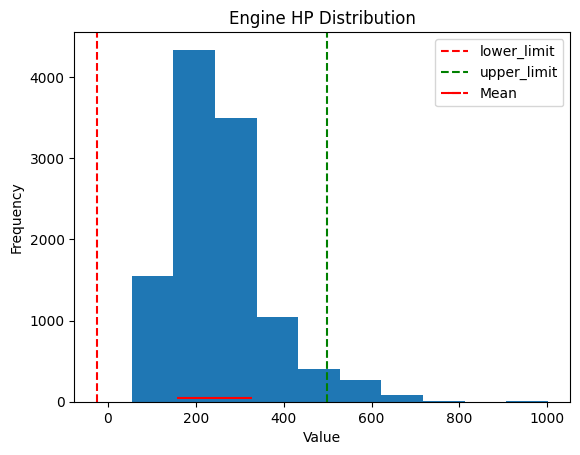

Q1 =  4.0  and Q3 =  6.0


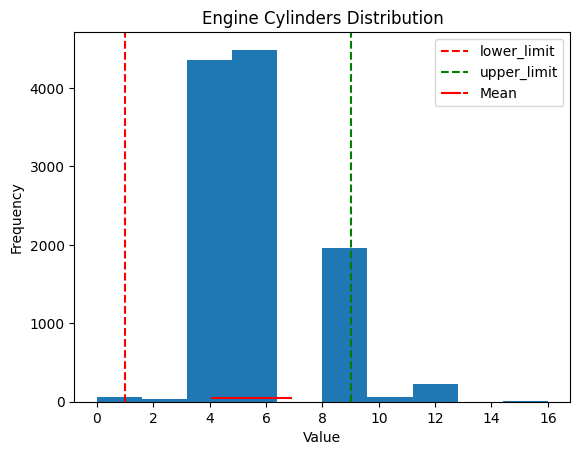

Q1 =  2.0  and Q3 =  4.0


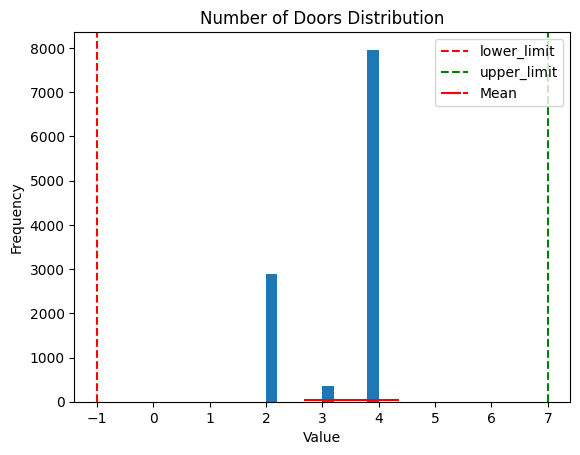

Q1 =  22.0  and Q3 =  30.0


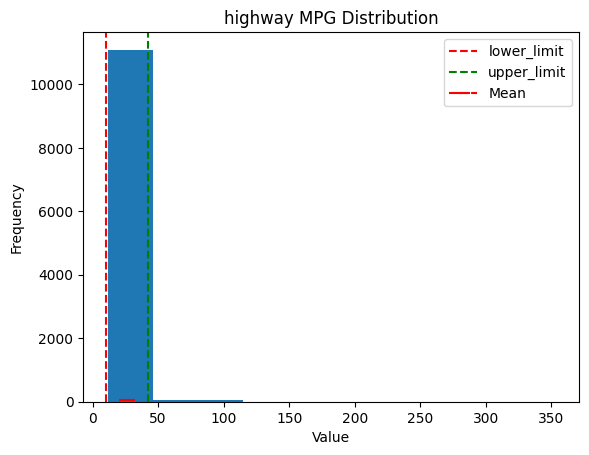

Q1 =  16.0  and Q3 =  22.0


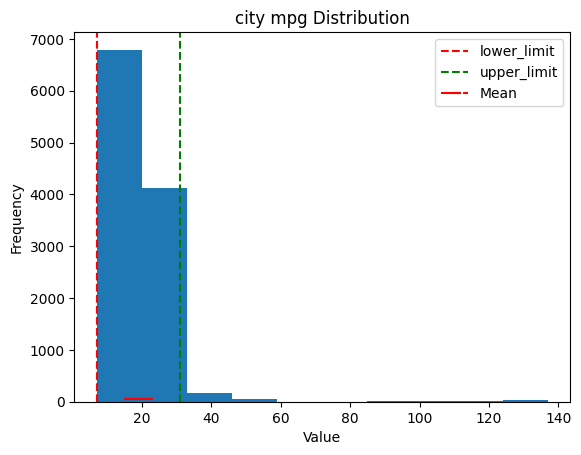

Q1 =  549.0  and Q3 =  2009.0


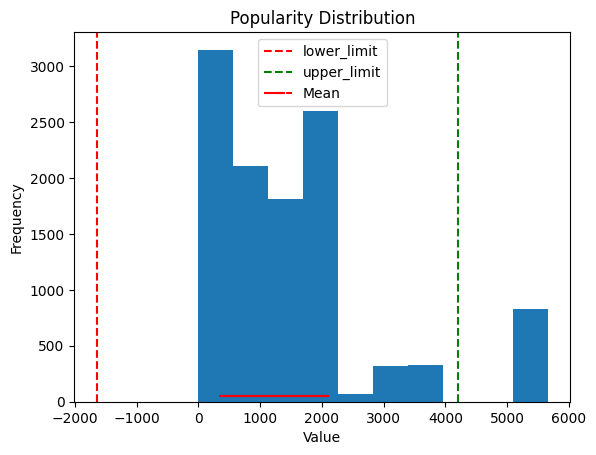

Q1 =  21600.0  and Q3 =  43036.25


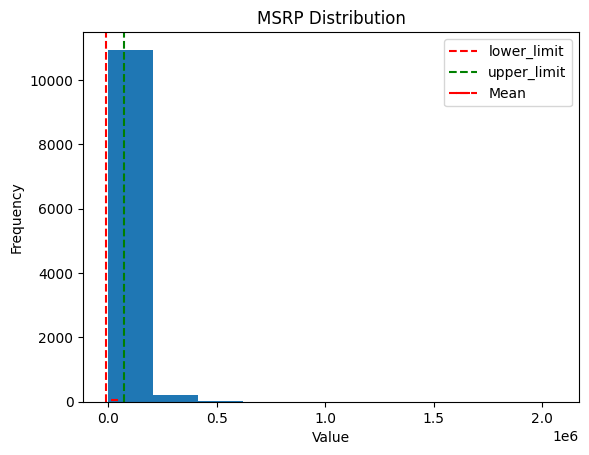

In [31]:
df_cleaned=Remove_Outlier(df.select_dtypes(exclude='object'),df)

In [32]:
#Dataset after removing outliers
df_cleaned.shape

(8522, 16)

# Compare different features with respect to frequency counts

In [33]:
#Frequency Distribution of numerical data

def frequency_dist(numerical_data):
    fig,ax=plt.subplots(nrows=1,ncols=len(numerical_data.columns),figsize=(16,4))
    for i,col in enumerate(numerical_data.columns):
        ax[i].set_title(col)
        ax[i].hist(x=numerical_data[col],bins=50)
    plt.show()
    plt.close() 

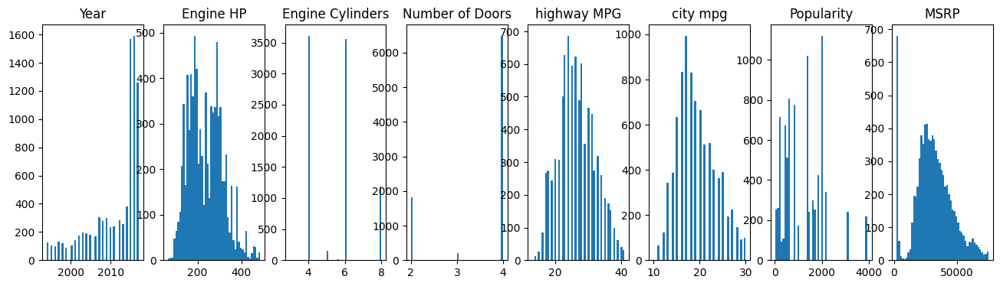

In [34]:
frequency_dist(df_cleaned.select_dtypes(exclude='object'))

#### according to above diagram Engine HP, highway MPG and City MPG have a normal distribution whereas Year and Popularity are right skewed and left skewed respectively.

In [59]:
#Frequency Distribution of categorical Data

def plot_categorical_data(df_cleaned):
    plt.rcParams['figure.figsize']=[16,26]
    plt.subplots_adjust(hspace=2, wspace=1)

    # count the frequency of each make
    plt.subplot(5,2,1)
    # plot a bar chart of the counts
    counts = df_cleaned['Make'].value_counts()
    counts.plot(kind='bar',color='yellow')
    plt.xlabel('Make')
    plt.ylabel('Frequency') 
    plt.title('Frequency of car makes')

    plt.subplot(5,2,2)
    # plot a bar chart of the counts
    counts = df_cleaned['Model'].value_counts()
    counts.plot(kind='bar',color='green')
    plt.xlabel('Model')
    plt.ylabel('Frequency')
    plt.title('Frequency of car models')

    plt.subplot(5,2,3)
    counts = df_cleaned['Engine Fuel Type'].value_counts()
    counts.plot(kind='bar',color='red')
    plt.xlabel('Engine Fuel Type')
    plt.ylabel('Frequency')
    plt.title('Frequency of Car Engine Fuel Types used')
    xtick_labels = plt.gca().get_xticklabels()
    plt.setp(xtick_labels, rotation=45, ha='right')
    
    plt.subplot(5,2,4)
    counts = df_cleaned['Transmission Type'].value_counts()
    counts.plot(kind='bar',color='blue')
    plt.xlabel('Transmission Type')
    plt.ylabel('Frequency') 
    plt.title('Frequency of Car Transmission Type')
    xtick_labels = plt.gca().get_xticklabels()
    plt.setp(xtick_labels, rotation=45, ha='right')

    

    plt.subplot(5,2,5)
    counts = df_cleaned['Driven_Wheels'].value_counts()
    counts.plot(kind='bar',color='black')
    plt.xlabel('Driven_Wheels')
    plt.ylabel('Frequency')
    plt.title('Frequency of Car Driven Wheels')
    xtick_labels = plt.gca().get_xticklabels()
    plt.setp(xtick_labels, rotation=45, ha='right')
    
    plt.subplot(5,2,6)
    counts = df_cleaned['Market Category'].value_counts()
    counts.plot(kind='bar',color='magenta')
    plt.xlabel('Market Category')
    plt.ylabel('Frequency')
    plt.title('Frequency of Market Category')
    plt.show()
    xtick_labels = plt.gca().get_xticklabels()
    plt.setp(xtick_labels, rotation=45, ha='right')    

    plt.subplot(5,2,7)
    counts = df_cleaned['Vehicle Size'].value_counts()
    counts.plot(kind='bar',color='orange')
    plt.xlabel('Vehicle Size')
    plt.ylabel('Frequency')
    plt.title('Frequency of Vehicle Size')
    plt.show()
    xtick_labels = plt.gca().get_xticklabels()
    plt.setp(xtick_labels, rotation=45, ha='right')    
    
    plt.subplot(5,2,8)
    counts = df_cleaned['Vehicle Style'].value_counts()
    counts.plot(kind='bar',color='brown')
    plt.xlabel('Vehicle Style')
    plt.ylabel('Frequency')
    plt.title('Frequency of Vehicle Style')
    xtick_labels = plt.gca().get_xticklabels()
    plt.setp(xtick_labels, rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

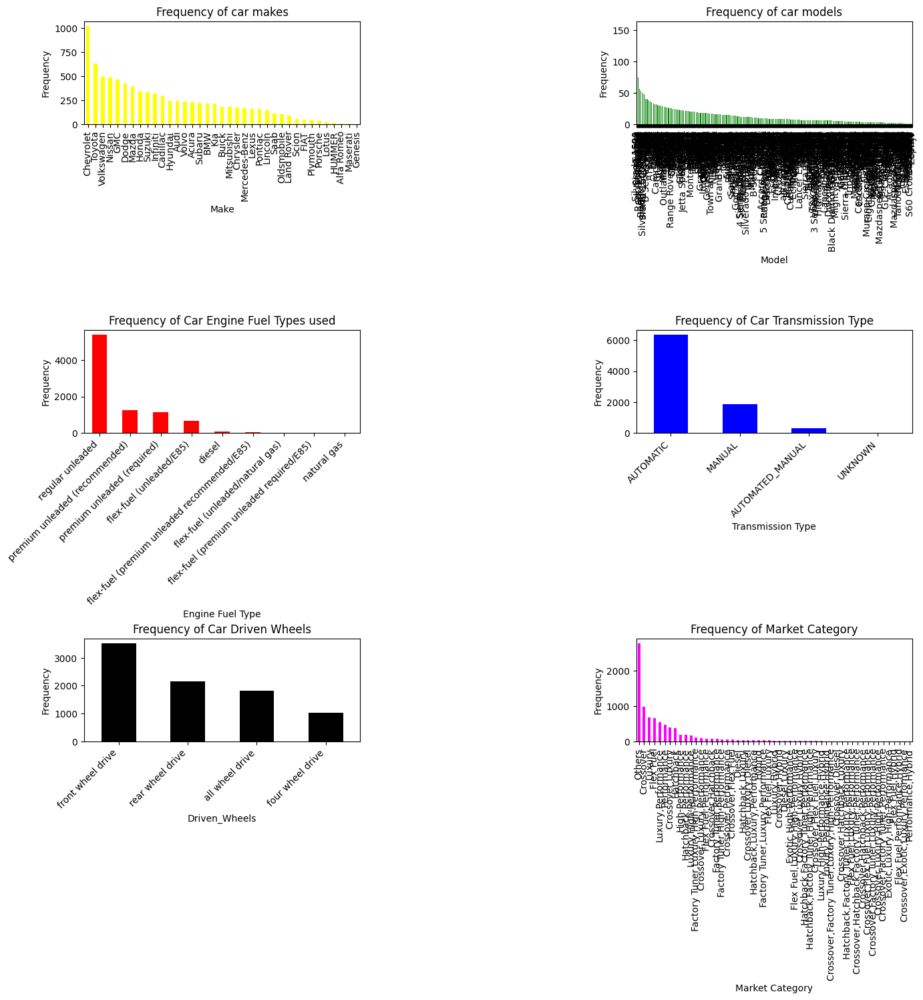

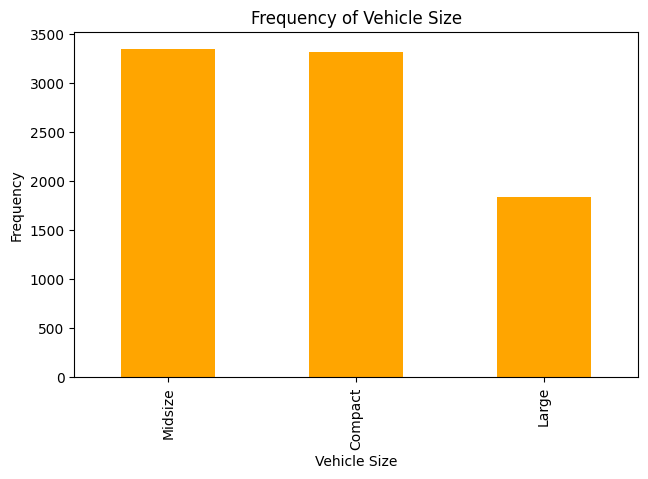

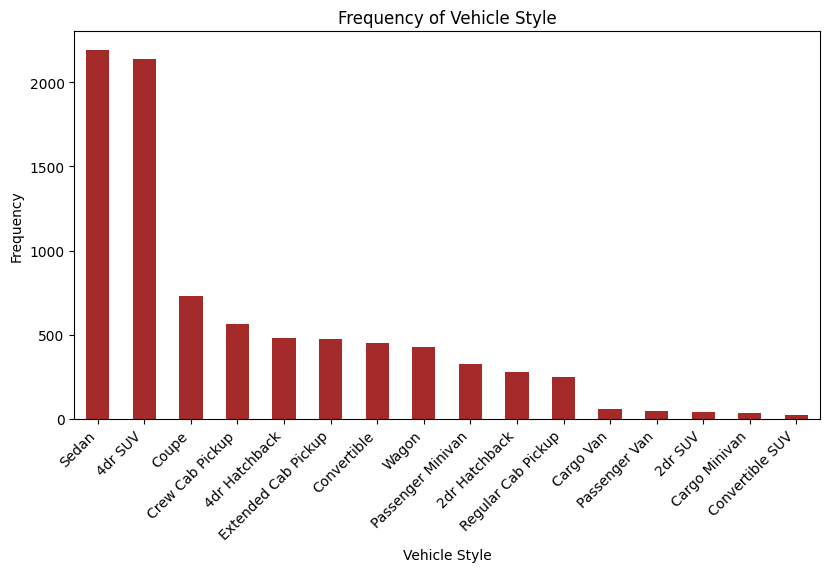

In [60]:
plot_categorical_data(df_cleaned)

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
Year,1.000000,0.344932,-0.087862,0.246625,0.356938,0.319893,0.201792,0.600945
Engine HP,0.344932,1.000000,0.737243,0.040075,-0.445580,-0.549592,0.114228,0.741756
Engine Cylinders,-0.087862,0.737243,1.000000,0.021396,-0.697813,-0.757164,0.031124,0.386882
Number of Doors,0.246625,0.040075,0.021396,1.000000,0.012784,0.033201,-0.076058,0.132498
highway MPG,0.356938,-0.445580,-0.697813,0.012784,1.000000,0.934198,0.073517,-0.112118
city mpg,0.319893,-0.549592,-0.757164,0.033201,0.934198,1.000000,0.061779,-0.189932
Popularity,0.201792,0.114228,0.031124,-0.076058,0.073517,0.061779,1.000000,0.121484
MSRP,0.600945,0.741756,0.386882,0.132498,-0.112118,-0.189932,0.121484,1.000000


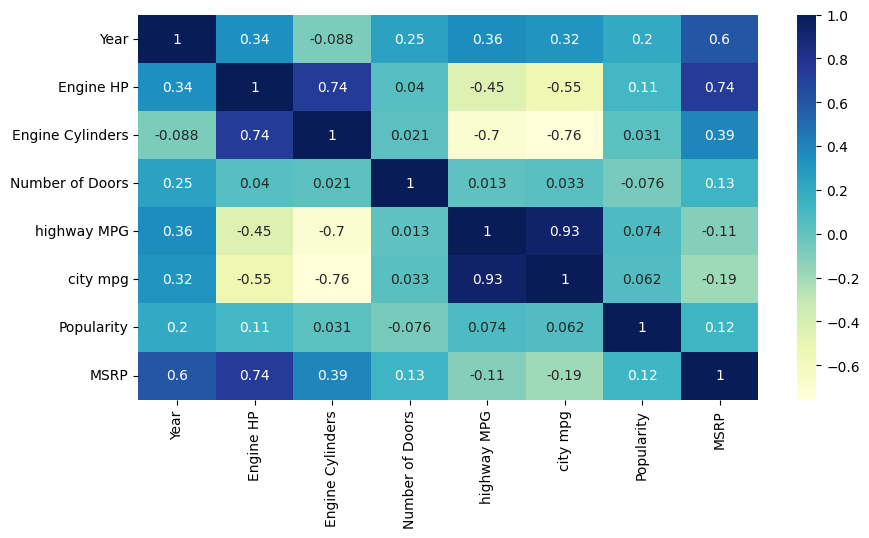

In [37]:
#Heatmap to find the correlation between features

plt.figure(figsize=(10,5))
c= df_cleaned.corr()
sns.heatmap(c,cmap="YlGnBu",annot=True)
c

#### It is noticed that Engine HP and Engine Cylinders have a high correlation.

# Static Graphical Representation

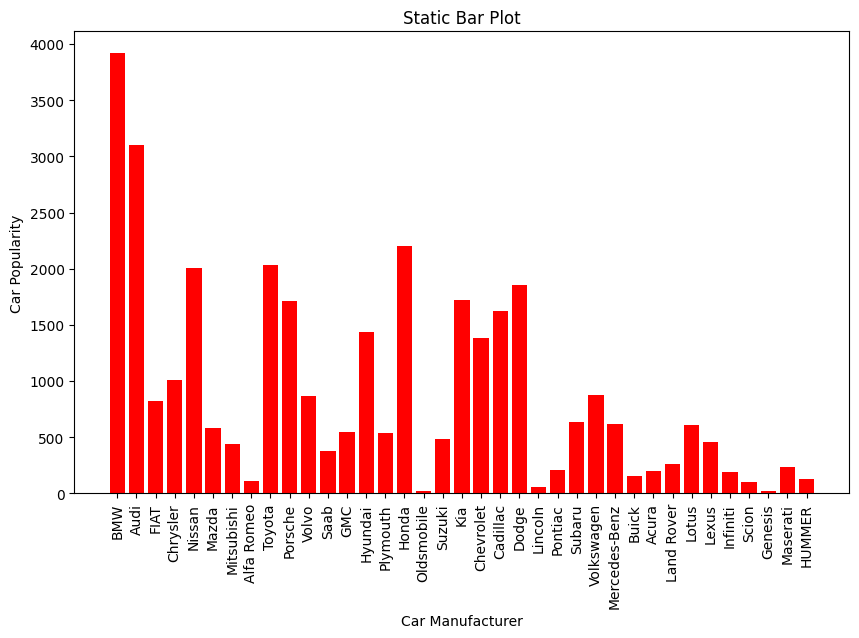

<Figure size 1600x2600 with 0 Axes>

In [38]:
# Static bar plot using Matplotlib representing car manufacturer and popularity

graphs=[]
fig=plt.figure(figsize=(10, 6))
plt.bar(df_cleaned['Make'], df_cleaned['Popularity'],color='r')
plt.title('Static Bar Plot')
plt.xlabel('Car Manufacturer')
plt.ylabel('Car Popularity')
plt.xticks(rotation=90)
plt.show()
plt.savefig('Static bar plot.jpg')

#### It is seen that BMW has the maximum popularity whereas Oldsmobile and Genesis have the least

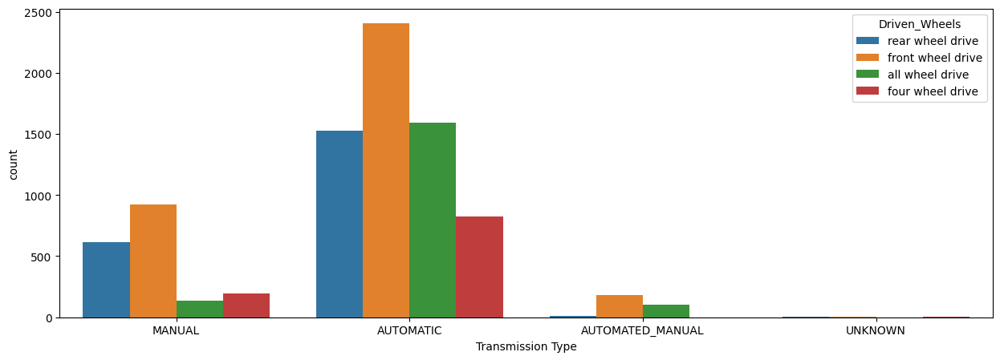

<Figure size 1600x2600 with 0 Axes>

In [39]:
#Countplot depicting various transmission type w.r.t to driven wheels

plt.figure(figsize=(15,5))
sns.countplot(x=df['Transmission Type'],hue=df['Driven_Wheels'],data=df_cleaned)
plt.show()
plt.savefig('Tramission Type by Driven Wheels.jpg')

##### It is observed that if its rear wheel drive or front wheel drive or all wheel drive or four wheel drive, Automatic cars are the maximum

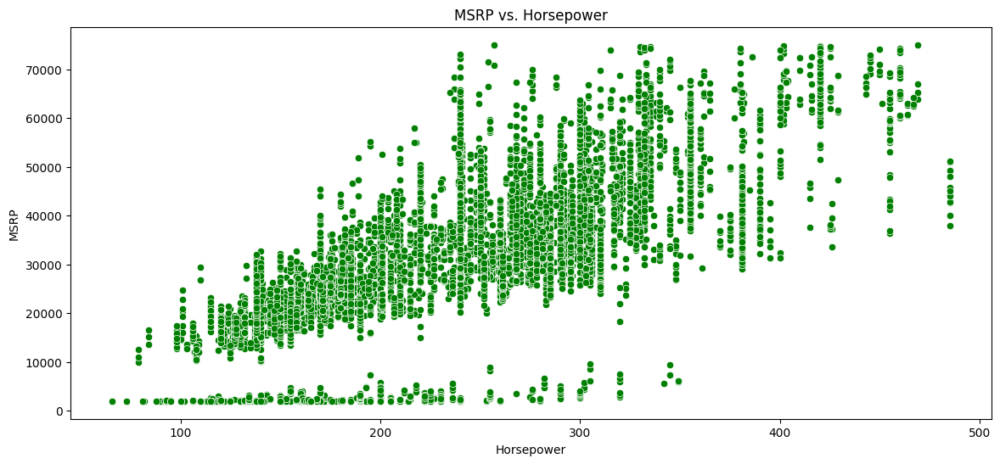

<Figure size 1600x2600 with 0 Axes>

In [41]:
# Scatter plot using Seaborn representing car price and and horse power

fig=plt.figure(figsize=(14, 6))
sns.scatterplot(x=df_cleaned['Engine HP'], y=df_cleaned['MSRP'], data=df_cleaned,color='green')
plt.xlabel('Horsepower')
plt.ylabel('MSRP')
plt.title('MSRP vs. Horsepower')

# Show the plot
plt.show()
plt.savefig("Scatterplot.png")

#### a significant relation between Horsepower and MSRP is seen where as the Horsepower increases the MSRP increases as well

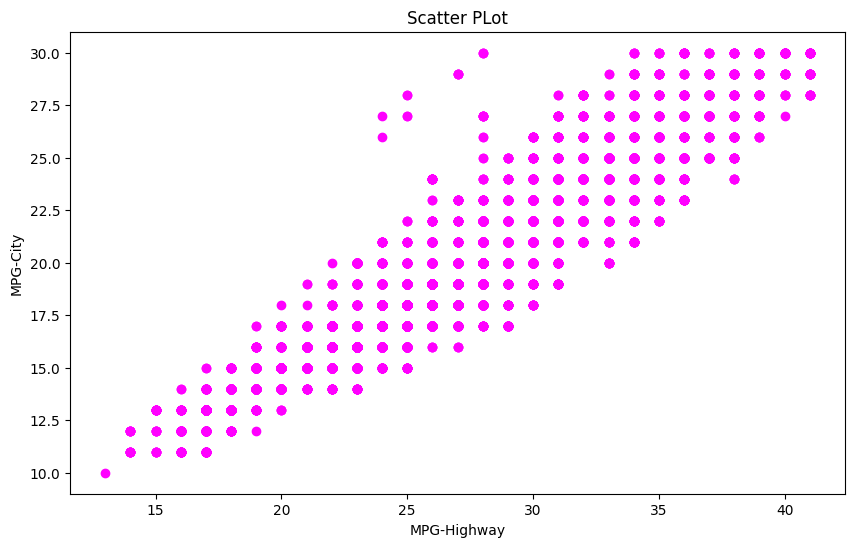

<Figure size 1600x2600 with 0 Axes>

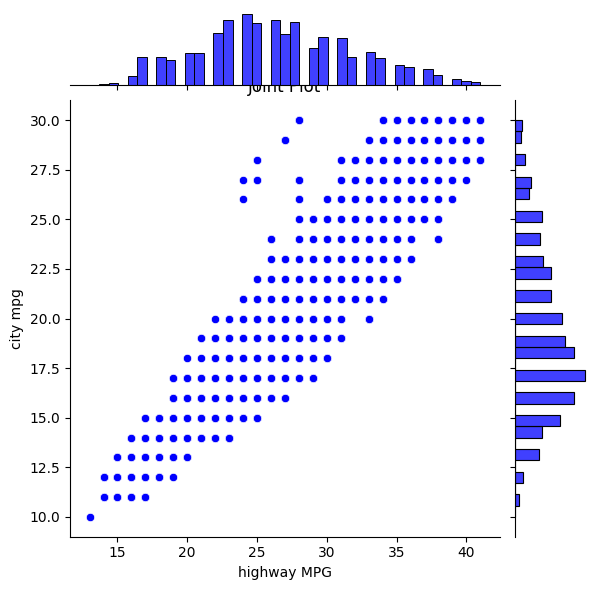

<Figure size 1600x2600 with 0 Axes>

In [42]:
# Scatter plot representing highway MPG and and City MPG

fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df_cleaned['highway MPG'], df['city mpg'],color='magenta')
ax.set_title('Scatter PLot')
ax.set_xlabel('MPG-Highway')
ax.set_ylabel('MPG-City')
plt.show()
plt.savefig("Scatter plot-MPG-H-MPG-C.jpg")

#Joint plot representing highway MPG and and City MPG
sns.jointplot(x=df['highway MPG'],y=df['city mpg'],data=df_cleaned,color='b')
plt.title('Joint Plot')
plt.show()
plt.savefig("Jointplot.png")

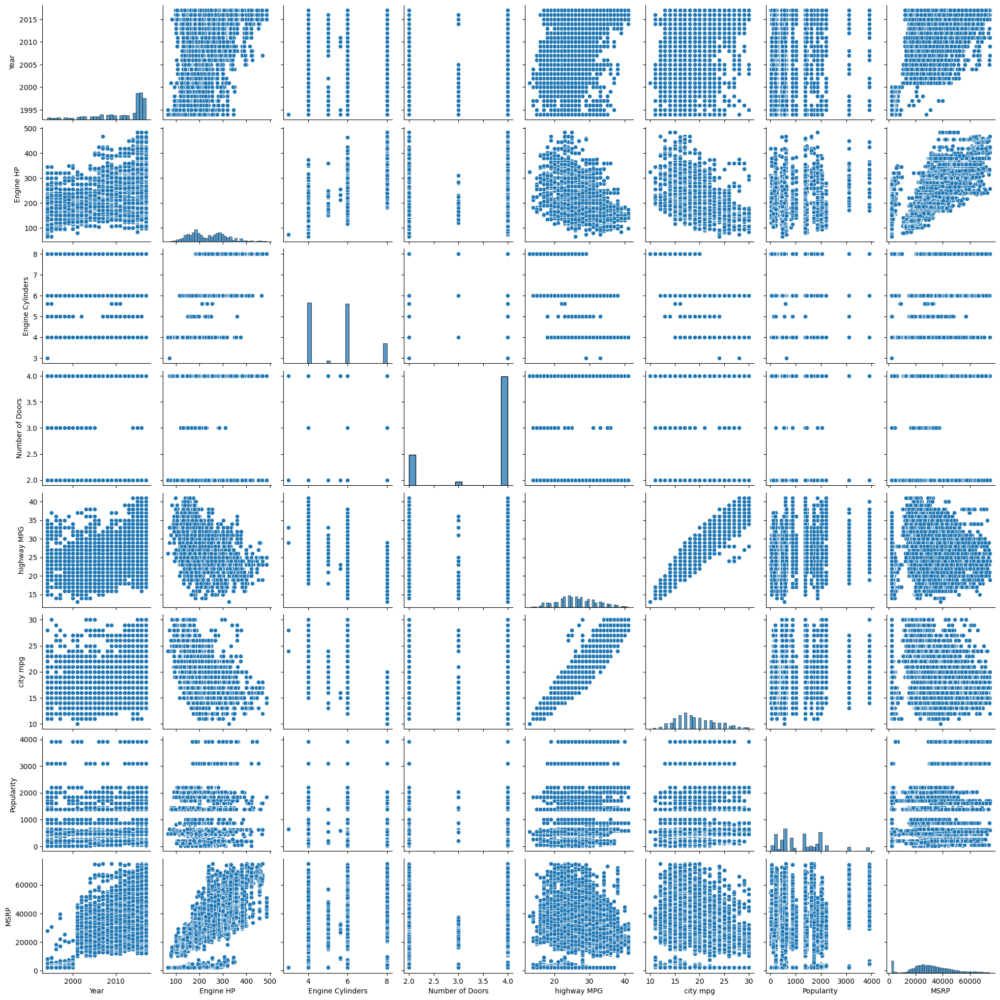

<Figure size 1600x2600 with 0 Axes>

In [43]:
#Pairplot depicting features in entire dataset

sns.pairplot(df_cleaned)
plt.show()
plt.savefig("features_pairplot.png")

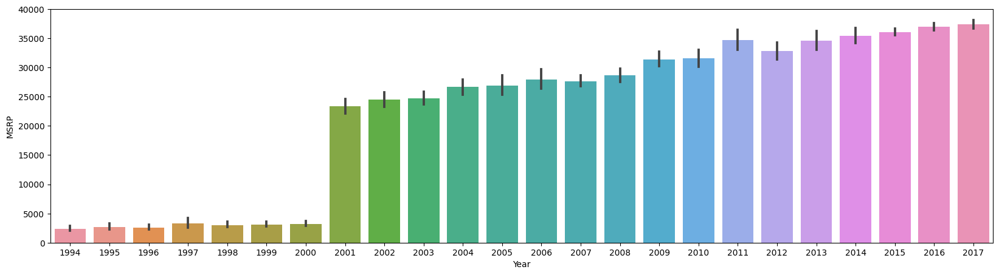

<Figure size 1600x2600 with 0 Axes>

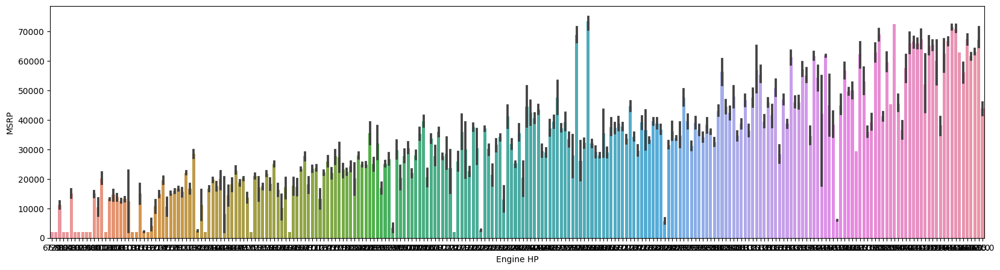

<Figure size 1600x2600 with 0 Axes>

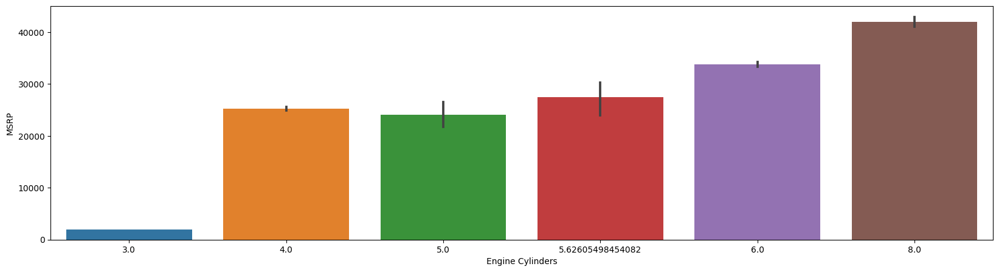

<Figure size 1600x2600 with 0 Axes>

In [44]:
to_plot = ['Year','Engine HP','Engine Cylinders']
for col in to_plot:
    plt.figure(figsize = (20,5))
    sns.barplot(x = col, y = 'MSRP', data = df_cleaned)
    plt.show()
    plt.savefig(f"{col}.png")

#### it is noticed that as the years passed the MSRP value of the cars increased as well. A directly proportional relation between MSRP and Engine cylinders too have been noticed

# Interactive Graphical Representation

In [45]:
# Interactive scatter plot using Plotly depicting the price of the car in accordance with their brand and year

counts=df['MSRP'].value_counts()
fig = px.scatter(df, x=df['Make'], y=df['Year'],color='MSRP')
fig.update_layout()
fig.update_traces()
fig.show()
graphs.append(fig)
plt.savefig("Car Price with brand and year.png")

<Figure size 1600x2600 with 0 Axes>

### it can be depicted that BMW, GMC, Mercedes and Infiniti have increased their MSRP has the years have passed

In [46]:
# Average price of car per year

import plotly.graph_objects as go
index = df_cleaned.groupby(['Year']).mean()['MSRP'].index.tolist()
mean_prices = df_cleaned.groupby(['Year']).mean()['MSRP'].values.tolist()
std_prices = df_cleaned.groupby(['Year']).std()['MSRP'].values.tolist()

price_per_year = pd.DataFrame(np.column_stack((mean_prices, std_prices)), columns=['Mean', 'Std'], index=index)

# Plot
fig = go.Figure()

fig.add_trace(go.Scatter(x=index, y=price_per_year.Mean,
                    mode='markers',
                    name='Mean Price'))

fig.add_trace(go.Scatter(x=index, y=price_per_year.Std,
                    mode='markers',
                    name='Std Price'))

fig.update_layout(title="Average MSRP per Year",
                  xaxis_title="Year",
                  yaxis_title="MSRP")

fig.show()
graphs.append(fig)

plt.savefig("Average price of car per year.png")

<Figure size 1600x2600 with 0 Axes>

#### it can be concluded that there is a considerable amount of difference between the Mean Price and std amount of the MSRP as the years have passed

In [47]:
# Interactive Histogram
fig = px.histogram(df_cleaned, x="Engine Cylinders", title='Engine cylinders',)
fig.show()

plt.savefig("Engine Cylinders.jpg")
graphs.append(fig)

<Figure size 1600x2600 with 0 Axes>

In [48]:
#Interactive Pie chart
data_pie = df_cleaned['Transmission Type'].value_counts()

fig = go.Figure(data=[go.Pie(labels=data_pie.index, values=data_pie.tolist(), textinfo='label+percent',
                             insidetextorientation='radial'
                            )])

fig.update_traces(hole=.3, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Pie chart of transmission type")

fig.show()
plt.savefig("transmission type pie.jpg")
graphs.append(fig)

<Figure size 1600x2600 with 0 Axes>

#### it can be said that maximum number of transmission type in the dataset is Automatic

Almost 75% of cars are automatic.

In [49]:
#Popularity of different car brands

fig = go.Figure()

fig.add_trace(go.Bar(
    x=df['Make'].unique(),
    y=df.groupby(['Make']).mean()['Popularity'],
    name='Proportion of cars per fuel type before 2015',
    marker_color='green'
))

fig.update_layout(xaxis_tickangle=-45,
                  title_text='Popularity of different car brands',
                  xaxis_title="Car Brand",
                  yaxis_title="Popularity")
fig.show()
plt.savefig("Popularity of different car brands.png")
graphs.append(fig)

<Figure size 1600x2600 with 0 Axes>

#### from the figure above one can tell that Chrysler is the most popular car

In [50]:
with open('Graphs.html', 'w') as f:
    for fig in graphs:
        f.write(fig.to_html(full_html=False,include_plotlyjs='cdn'))